#USAGE INFO
This script requires several external items as input that must be provided:
1) the genome dataframe
2) all relevant genomic sequences (chromosome and plasmids, both direct and complementary)
3) a list with the query genes from which to extract the upstream region (a  txt file named "querylist.txt", comma-separated and with no headers)

1 and 2 are included in a [github folder](https://github.com/omirene/upextract_anabaena/tree/main/Anabaena%20sp.%20PCC%207120%20upstream%20extractor%20files) along with example querylists (one correct, one with errors).
In principle, once all files (query list included) are uploaded and desired inputs updated, Ctrl+F9 (or Runtime -> Run All) should automatically execute the code and download the result file.


Furthermore, it requires input on:
1) Whether to include the coding region
of upstream-encoded genes or not (NOORF option on or off)
2) How high upstream and into the cds should the sequence retrieve

These are to be written below in INPUT INFORMATION

LIMITATIONS: this code does not account for genomic circularity. For genes whose upstream sequence would cross into the "end" of the genomic element (such as alr8001 or asr9501), upstream sequence will be limited to up to coordinate 1. The higher the upstream, the more likely this is to happen.  An "expected length error" should warn if the upstream sequence goes past the limits of the DNA template in linear form for NOORF="no", but it can't do this for NOORF="yes" since there is no expected length.
"Mounted" genes (i.e. those whose ATG is found within the cds of the upstream gene) will add nts in the sequence just before the ATG. Check manually and remove extra nts based on the lengths stated in the error warning.

This code tries to account for all genes and warn for general errors (inclusion of known limited-compatibility cases, incorrect loci, otherwise incorrect retrieved length).

In [ ]:
#INPUT INFORMATION: the gene/s of interest, sequence to be retrieved, NOORF option
NOORF="no" #"no": sequence retrieved regardless of overlap with upstream-encoded genes."yes": sequence will exclude the intergenic region only
upstream=100 #how many nt upstream of ATG to go
downstream=900 #how many nt into the cds to go

In [ ]:
#Make a list of known error-prone loci to issue a warning if included within the query list
troublesome=["all5371", "alr7502", "alr7503","all7686","alr8001", "all8090", "alr9001","all9031", "asr9501"]

NOTE: since python is 0-indexed but the genome starts at "1" position, this first position is treated here as 0 position. ex: [9:50] would give us the sequence from pos 10 to 49 of genome.
Because of this, sometimes a phase correction factor is required (+1 or -1).


In [ ]:
#Prepare the list to include the query genes whose upstream sequence we wish to retrieve
querylist=[]

#Upload the query list with genes whose promoter sequences we wish to extract, assigned to QUERYLIST
with open('querylist.txt', 'r') as queryfile:
    for line in queryfile:
        stripline = line.rstrip() # Strip off the line break for each line so the list includes only the locus names
        querylist.append(stripline) # Append the stripped line to the query list

print(querylist)

['all7362']


In [ ]:
#Import the Genome dataframe from the csv file
#This contains the location (chromosome or plasmids), strand, ATG location and end point for each locus
import pandas as pd
genomedata=pd.read_csv("GenomeDatav3.csv",sep=";")
genomedata


,locus,location,strand,ATG,end
0,all0001,Chr,comp,918,6413460
1,all0002,Chr,comp,1718,981
2,asl0003,Chr,comp,2805,2617
3,all0004,Chr,comp,4365,3418
4,all0005,Chr,comp,5974,4454
...,...,...,...,...,...
6130,asr9501,zeta,direct,1476,1700
6131,asl9502,zeta,comp,1888,1706
6132,asr9503,zeta,direct,2359,2565
6133,alr9504,zeta,direct,2957,4129


Since each locus is encoded in a different element (chromosome or plasmids, direct or complementary strand), a dictionary to assign a key identifying each unique element to its sequence (obtained from the provided txt files) is required.
Since the "location" column of our genome dataframe contains only the genomic element (chromosome/plasmid) and not the strand, an individual dictionary per strand is most convenient.

In [ ]:
#Read the content of each file into a string and store it in the dictionary
locationsdir={'Chr':open("chrdirstripped.txt", 'r').read(),
           "alpha":open("aldirstripped.txt", 'r').read(),
           "beta":open("betdirstripped.txt", 'r').read(),
           "gamma":open("gamdirstripped.txt", 'r').read(),
           "delta":open("deldirstripped.txt", 'r').read(),
           "epsilon":open("epdirstripped.txt", 'r').read(),
           "zeta":open("zetdirstripped.txt", 'r').read()}
display(locationsdir)
locationscomp={'Chr':open("chrcompstripped.txt", 'r').read(),
           "alpha":open("alcompstripped.txt", 'r').read(),
           "beta":open("betcompstripped.txt", 'r').read(),
           "gamma":open("gamcompstripped.txt", 'r').read(),
           "delta":open("delcompstripped.txt", 'r').read(),
           "epsilon":open("epcompstripped.txt", 'r').read(),
           "zeta":open("zetcompstripped.txt", 'r').read()}
display(locationscomp)
#Note: display code only there for reassurance

{'Chr': 'CCTAGGCGAACCTTTAGCAGTAGCGACAAAAGCTAAATCACCCCTAAGCCCTTCTCCCTCGATAACTTCAAGTCCTCCTGATGTTGTAGTCTCAGTTAAAACTTCCCCATAAGGTGTTACTCCCTCTTGAATCAAAGCTCCTGTCTCTTGAGCTACTCGCCCATACAAACCGCCATTTTTTAACGGGAAAGTATATGGATAAGAGAGTATCCTCAAACTTATCTCTTGAGTTTCTTTATTGTTTCCTGAACGTAAGGCATTTAACCCTCTTTCAATGTTATCGACATAAAATTGCGTCATTTTGGAGTCTAGTCCTAGCTGACCAATTTGTTGCTTTAAGTCAGGTATTTTTGATGCTTCCTGTAAAAGAGTGTTGACGTAGCTAATCTTCAAGTTTATGAATCCACTACGAGGATCAGATCCTGGAAGAGGTGATAATGGGAAGTTTTTAGTGACATCTCTTAAACCTGCGACGGGATTAGAACTCAGCCTAGAACCAGAACTATATTGAACAGAATCTAAAATTTCTCTATCAAATTTTCTCCAGACAGAGGCGTATGGGTTGGGATTGTAACCGTAAAAACTAGAAAACTTGCGATAGTTATCTTCCCCACCAGCTGCTCGCATTAACATCTGTTGATAGGTAGGGCCGCCATTAGACTGAATGACTTGCTCAAGAATCGTCCCAGTTTTGTTGCAGCCTAAAGCAAATCCTACGGAGCATTCGGGAATGACTCTTATCCGATGCAGACCTTTACCATCATTCTGTAGCTGATACTGGAGTAGCTGACGCTCTTGTCCAGGTGGAATCTTTGCACCGACATTTAAACTTCCTTTGCCTGCATTTGCGTTCTCACATACAGTTAATACTGCTGCCAAAGATGACAACAATATGACAATATTTCTAACGAATTTCATATATGCTTGGTAAACAACACAAAACTAACTAAGTACAACAACCACCTTTGAGAGGTGAGTATTTATTGATTGG

{'Chr': 'TTTTCGCCATACTGGTTCCTTTTAGCTCTTCCTTTATTTCTCCTATTATTAAGTAGAGATAATCCAGCAATTTCCTCACCTCCTAGAACATCAGGTATCCCGACTCCGCCAACTAATCCTCCCAGTAATGTATGTGATTTTGTCAATCCTGGTGGAAACCCGAACGGAGGAGTTTGTGAAACTCCCATTACTCAACCCCCAACAGAAGTGACCAGGGTAATGGAACCATCGACTATGAAAGCTATTCTGTTGTTGACTTTGATATTTTGTTTAGTCCGCTATAAGCAGAGGTCTGTTCAGACAAAATATTGAATAAATTAATGGATAAACTTGCAAGATATAGTTGTTAATCCAATCCTAAAAAAACTTTAATGGTCACCATAAGAGGTTATTTCTAAAGTAAAGATAAAATTTACATGGCATCAGTTTATATGACGGTGCGTTAGGGTAGTTTCATAACACACTCTACATTAATGTTTACTTTATAAATAGTTACTAATTTAGGATGACTGGACTAAATAGCTGTGATGAACTGGGTGCATTATCAGATTTGAACCCAGGTATTTTGAATAAAAATCTCTCAGTGATAAACTGAGAGATTTTGCCTTTTATTACTTTTCACATGAATATATCCCACTCTTACAGGATATCTATACTTTTAAAATTGAGTGTGCCAAAATGCCTAATTGTTATTTGTCTGTCAGAACAATATGACTCAGCTGATTGAATACGAAGACGCAAGTGATGAAGTAAAGTCGGTATACGACGACATCCGCGCTACTCGTCAGACGGAGTACATCAACAATTTCTGGAAAGCCATAGCTAACCATCCTCCCACCTTAAAAAGAACCTGGGAAACCATCAAAGAGGTGATGGCTAGTCCTGGTGAACTTGATCCTTTGGTACGGGAACTGATTTACATTGCTGTGAGTGTCACTAATGGCTGTGACTATTGTATTTCTTCCCATTCAGCCGCAGCTCGTGGGAAGGG

Since the total length of each genomic location is relevant for position calculations later on, we save them on a dictionary in a similar manner.

In [ ]:
#Save the total length of each location for future use in position calculation
loclength={'Chr':6413771,
          "alpha":408101,
          "beta":186614,
           "gamma":101965,
           "delta":55414,
           "epsilon":40340,
           "zeta":5584}
display(loclength)

{'Chr': 6413771,
 'alpha': 408101,
 'beta': 186614,
 'gamma': 101965,
 'delta': 55414,
 'epsilon': 40340,
 'zeta': 5584}

The code ahead will, broadly, follow this scheme:
1.   Retrieve the required information about each loci in the query list
2.   Determine which genomic configuration it belongs to (direct or complementary strand; upstream gene is on the same strand or not)
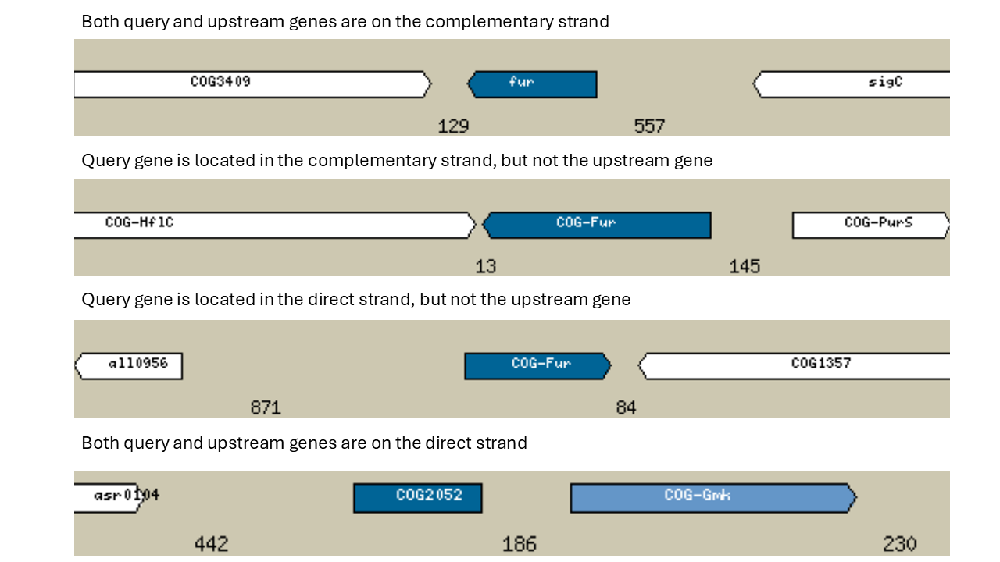
This is relevant to identify whether the point closest to our query gene is the ATG or the stop codon of the upstream-encoded gene
2.   Locate the coordinates of the desired start and end of the sequence to retrieve
1.   Extract the corresponding sequence from the right genomic element and strand

Like this, an "output" will be generated per query, comprising:
*   Part1: corresponding to the overlap with the upstream-encoded gene, if applicable
*   Part2: intergenic region
*   Part3: sequence into the cds

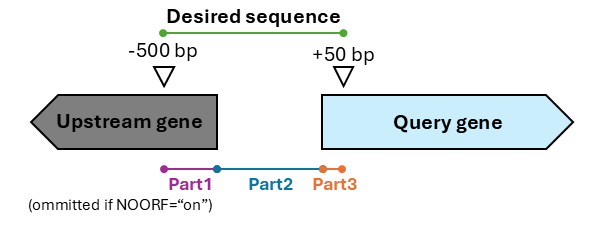

Finally, a resultslist will be updated each cycle to include the newly generated output before iterating.








In [ ]:
#Initialise an empty results list, and output and sequence variables
print("start")
resultlist=""
output=""
sequence=""
#For quality assurance, we include an option for error warnings, which requires the corresponding variables
errorslist=""
error=""

for item in querylist:   #For every locus in the query list
  #We reinitialise our variables (not out results or error lists) to ensure they are emptied every cycle
  output=""
  sequence=""
  error=""
  part1=""
  part2=""
  part3=""

  #Make sure the locus is included in the genomic data list
  #If not included, assign the locus identifier to an error
  if item not in genomedata['locus'].values:
    error+=item+" not found in genome dataset. Please check name or retrieve manually"+"\n"
    errorslist+=error
    print("ERROR: could not run"+"\n")
    continue

  #Check if the query list contains any locus known to have limited compatibility to issue a warning
  if item in troublesome:
    error+="this code does not account for circularity, check "+item+" output"+"\n"
    errorslist+=error

  #Proceed with the obtention of the desired upstream sequence

  itemno=genomedata[genomedata['locus'] == item].index[0]
  #Locate the item (our gene locus) in the dataframe: itemno retrieves the row number which contains all other info on the item
  genelocation=genomedata.loc[itemno,"location"]
  #Retrieve the location associated to the query locus (same row, "location" column)
  geneATG=genomedata.loc[itemno,"ATG"]
  geneEnd=genomedata.loc[itemno,"end"]
  geneSTRAND=genomedata.loc[itemno,"strand"]
  #Retrieve the coordinates of the cds and strand of the query locus (same row, ATG/end/strand columns)

  #To determine which template to extract a sequence from, we separate queries based on their strand
  if geneSTRAND == "direct":
    #Retrieve the appropiate template from the direct location dictionary
    sequence=locationsdir.get(genelocation)
    #DEtermine if the upstream gene is in the same strand; if so, the closest point of the upstream gene is the cds end (otherwise, it's the ATG)
    if geneSTRAND==genomedata.loc[itemno-1,"strand"]:
      uptouch="end"
    else:
      uptouch="ATG"
    if (geneATG-upstream)<(genomedata.loc[itemno-1,uptouch]):
    #Code if the upstream end of the desired sequence falls within the upstream cds.
      part1=sequence[geneATG-upstream-1:genomedata.loc[itemno-1,uptouch]]
      #If so, part1=sequence from the point upstream until the end of the upstream gene (-1 python/genome index correction factor)
      part2=sequence[genomedata.loc[itemno-1,uptouch]:geneATG-1]
      #Part2: intergenic sequence from the end of the upstream gene until the ATG of the query gene (-1 python/genome index correction factor)
    else:
    #Code if the entire sequence to be retrieved comprises an intergenic region (i.e. part 1 is omitted)
      part1=""
      part2=sequence[geneATG-upstream-1:geneATG-1]
      #Whole sequence from upstream to ATG (-1 python-genome index correction factor)
    part3=sequence[geneATG-1:geneATG+downstream-1]
    #Final section, from the ATG and up to the desired downstream point (coding sequence of query gene)

  #The same applies to complementary strand genes - key differences in determining coordinates
  elif geneSTRAND == "comp":
    seqlen=loclength.get(genelocation)
    sequence=locationscomp.get(genelocation)
    part1=""
    part2=""
    part3=""

    if geneSTRAND==genomedata.loc[itemno+1,"strand"]:
      uptouch="end"
    else:
      uptouch="ATG"

    if (geneATG+upstream)>(genomedata.loc[itemno+1,uptouch]):
      part1=sequence[seqlen-(geneATG+upstream):seqlen-genomedata.loc[itemno+1,uptouch]+1]
      #Sequence from the point upstream until the end of the upstream gene (+1 python-genome index correction factor)
      part2=sequence[seqlen-genomedata.loc[itemno+1,uptouch]+1:seqlen-geneATG]
      #Intergenic sequence, from the end of the upstream gene until the ATG of the query gene (+1 python-genome index correction factor)
    else:
      part1=""
      part2=sequence[seqlen-(geneATG+upstream):seqlen-geneATG]
      #Whole sequence from upstream to ATG (+1 python-genome index correction factor)
    part3=sequence[seqlen-geneATG:seqlen-(geneATG-downstream)]
    #Whole sequence from ATG to the end point desired

  else:
      print("Check again - for an unknown reason, the code could not run")

  #Finalization of the output for this iteration of the loop, including a fasta format ID of the corresponding query locus
  if NOORF=="yes":
  #If NOORF option is turned on, we don't want the coding region of the upstream gene (part1)
    output+=">"+item+"\n"+part2+part3+"\n"
  elif NOORF=="no":
  #If NOORF option is disabled, we want the whole sequence
    output+=">"+item+"\n"+part1+part2+part3+"\n"
    #As a quality check, we make sure that the output is the expected length; otherwise, we add it to the error list
    outputlength=len(part1+part2+part3)
    expectedlength=upstream+downstream
    if outputlength!=expectedlength:
      error="output for "+item+" does not match expected length: "+str(outputlength)+" instead of "+str(expectedlength)+"\n"
      errorslist+=error
      print("warning: output produced may be incorrect")


  #Adds the output to the growing results list
  resultlist+=output
  print("loop successful"+"\n")

start
loop successful



In [ ]:
print(errorslist)

In [ ]:
print(resultlist)

>all7362
CGGGCAGGAGACTTGAAAATTTGAAGCCTAGCTGAGTGAAAGTCAGGAAATACAATCACAAGTGTTGAAGTGAAATAAATCTCTAAAGGTGCGTCAATTTATGGGAATTTGTGGAAAATTGGGTGTAGCGGCGTTGGTGGCGTTGATTGTCGGGTGTTCGCCTGTCCAATCCCAAGTGCCACCATTAACTGAACTTTCCCCATCAATCAGCGTGCATTTACTGCTGGGAAATCCCAGTGGTGCAACGCCAACAAAGCTTACACCTGATAATTACCTGATGGTCAAAAATCAATATGCACTCTCCTACAACAACAGCAAGGGAACTGCTAACTGGGTAGCTTGGCAGCTTAACTCCTCATGGCTAGGGAACGCAGAGCGTCAAGATAACTTCCGCCCAGACAAAACATTGCCTGCGGGTTGGGTGCGAGTGACTCCTTCTATGTACTCTGGGAGTGGTTATGACCGGGGGCATATTGCACCTTCAGCAGACCGCACCAAGACAACAGAAGATAATGCGGCTACTTTCCTGATGACAAACATGATGCCCCAAACACCCGATAACAATAGAAATACGTGGGGAAATTTAGAAGATTATTGTCGAGAATTAGTCAGTCAGGGTAAAGAGCTTTACATTGTTGCCGGGCCTAATGGTAGTCTTGGCAAACCCCTCAAAGGTAAGGTGACAGTTCCCAAATCCACTTGGAAGATTGTTGTCGTACTAGATAGCCCAGGCTCAGGGCTTGAAGGTATTACTGCTAATACTCGCGTTATCGCAGTAAATATTCCCAACGACCCAGAATTAAATAATGACTGGAGGGCTTATAAAGTCAGTGTTGATGAATTAGAAAGTTTGACGGGTTATGATTTTTTGTCTAATGTTTCCCCCAATATTCAAACAAGTATTGAGAGTAAAGTTGATAATTAGTAAATAGGTCAAGTTTCCACAACTTTAGTAGAAATACCAGCTAAATTTCCTGCTGGAGTTTCACCA

In [ ]:
#Create and download a RTF file containing the results and one containing the errors
with open('upsequences.rtf',"w") as outputfile:
    outputfile.write(resultlist)
from google.colab import files
files.download('upsequences.rtf')

#Generate the file only if the errors list has been populated
if errorslist!="":
  with open('errorwarnings.rtf',"w") as outputfile:
    outputfile.write(errorslist)
  from google.colab import files
  files.download('errorwarnings.rtf')

print("Done")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Done
